<a href="https://colab.research.google.com/github/iyappan24/Applied-AI-Notebooks/blob/master/DecisionTrees.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## AMAZON FINE FOOD REVIEWS : DECISION TREE


Data Source: https://www.kaggle.com/snap/amazon-fine-food-reviews

The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review


**DATA SET SPLITS ** 

1. AVG_WORD2VEC : 70K TRAIN,  30K TEST
2. TFIDF_WORD2VEC : 70K TRAIN ,  30K TEST
3. BOW : 60K TRAIN,  20K CV,  20K TEST
4. TFIDF : 60K TRAIN, 20K CV,  20K TEST

In [0]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score,f1_score,roc_auc_score,precision_score, recall_score
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
import pickle
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import GridSearchCV
from scipy.sparse import vstack
import operator
import wordcloud
import sklearn.metrics as metrics
import pydotplus
from sklearn import tree
import collections
from IPython.display import SVG
from graphviz import Source
from IPython.display import display
from IPython.display import Image

** MOUNTING GOOGLE DRIVE TO GET THE DATA **

In [7]:
from google.colab import drive
drive.mount('/content/gdrive',force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


## FEATURIZATION : WORD2VEC

** Importing the data **

In [0]:
w2v_train = pickle.load(open('/content/gdrive/My Drive/AppliedAI/Amazon Fine Food Reviews/avg_word2vec_train.sav','rb'))
w2v_test = pickle.load(open('/content/gdrive/My Drive/AppliedAI/Amazon Fine Food Reviews/avg_word2vec_test.sav','rb'))

In [0]:
w2v_train.head()

,Vector 1,Vector 2,Vector 3,Vector 4,Vector 5,Vector 6,Vector 7,Vector 8,Vector 9,Vector 10,...,Vector 42,Vector 43,Vector 44,Vector 45,Vector 46,Vector 47,Vector 48,Vector 49,Vector 50,Score
0,0.121816,0.112731,0.522326,0.513944,0.014699,-0.510498,0.332466,-0.006182,0.510940,0.342244,...,-0.260098,-0.572254,-0.001088,0.079892,-0.092751,0.165952,0.354566,0.263851,-0.243470,1
1,0.317572,0.159626,0.343828,0.280532,0.477560,-0.579655,-0.058227,0.002837,0.070905,-0.068868,...,-0.401967,-0.649971,-0.189747,0.091126,-0.250324,-0.020535,0.567875,0.291098,-0.287811,1
2,0.113726,-0.240282,0.779548,0.906329,0.285768,-0.143818,0.310017,-0.139928,0.367076,0.384066,...,-0.153836,-0.216731,-0.155472,0.010060,-0.179123,0.395463,-0.208602,-0.294666,0.091154,1
3,0.601365,0.113279,0.712399,0.237966,0.321083,-0.329348,0.301765,-0.035661,0.460765,-0.075949,...,-0.091186,-0.206183,0.062646,0.104041,0.018641,0.299300,-0.000715,-0.171055,-0.046017,1
4,0.110524,-0.161300,0.858878,1.161848,0.425219,-0.414926,0.006795,-0.259896,0.324213,0.731779,...,-0.187014,-0.071594,-0.525720,0.221244,-0.213230,0.498298,-0.212721,-0.079328,0.490372,1


** Separating the X and Y from the datasets (train and test) ** 
1. X : Vectors 1 to 50 
2. Y : Target  Variable 

In [0]:
X_train = w2v_train.iloc[:,0:50].copy(deep=True)
X_test = w2v_test.iloc[:,0:50].copy(deep=True)
y_train = w2v_train['Score']
y_test = w2v_test['Score']

** GRID SEARCH - PARAM DEFINITIONS ** 

<br>
_____


In [0]:
#params_combos
c = ["gini","entropy"]
max_depth = [3,5,7,9,11,13,15]
min_samples =[5,10,15,20]

param_grid = {'criterion':c,'max_depth':max_depth,'min_samples_split':min_samples}

** GRID SEARCH : ** 

** Scoring : F1 SCORE  of Negative classs : ** 

In [0]:
model = GridSearchCV(DecisionTreeClassifier(max_features = None,class_weight='balanced'),param_grid,n_jobs =-1,scoring= metrics.make_scorer(metrics.scorer.f1_score,average="binary",pos_label =0),verbose=True)
model.fit(X_train,y_train)

Fitting 3 folds for each of 56 candidates, totalling 168 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 168 out of 168 | elapsed:  7.8min finished


GridSearchCV(cv=None, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=None, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'criterion': ['gini', 'entropy'], 'max_depth': [3, 5, 7, 9, 11, 13, 15], 'min_samples_split': [5, 10, 15, 20]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=make_scorer(f1_score, average=binary, pos_label=0),
       verbose=True)

In [0]:
model.best_score_

0.43377313820410585

In [0]:
pred = model.predict(X_test)
print(classification_report(pred,y_test))

             precision    recall  f1-score   support

          0       0.62      0.38      0.47      6712
          1       0.84      0.93      0.88     23288

avg / total       0.79      0.81      0.79     30000



** Getting the Best Params ** 

In [0]:
model.best_params_

{'criterion': 'gini', 'max_depth': 15, 'min_samples_split': 5}

** Looking into the Test and Train  Score for  the parameters** 

In [0]:
results = pd.DataFrame(model.cv_results_['params'])
results['Mean_Train_Score'] = model.cv_results_['mean_train_score']
results['Mean_Test_Score'] = model.cv_results_['mean_test_score']

In [0]:
results[results['Mean_Test_Score'] ==max(results['Mean_Test_Score'])]

,criterion,max_depth,min_samples_split,Mean_Train_Score,Mean_Test_Score
24,gini,15,5,0.749584,0.433773


In [0]:
results.groupby('criterion').aggregate(np.mean)['Mean_Test_Score']

criterion
entropy    0.401335
gini       0.410771
Name: Mean_Test_Score, dtype: float64

In [0]:
results.groupby('max_depth').aggregate(np.mean)['Mean_Test_Score']

max_depth
3     0.372282
5     0.397115
7     0.413039
9     0.414869
11    0.416523
13    0.415958
15    0.412588
Name: Mean_Test_Score, dtype: float64

In [0]:
results.groupby('min_samples_split').aggregate(np.mean)['Mean_Test_Score']

min_samples_split
5     0.407889
10    0.406663
15    0.405429
20    0.404231
Name: Mean_Test_Score, dtype: float64

** Inferences ** 
1. It appears that the parameter min_samples_split is not making any significant difference in the  improvent F1 score  of the negative class lablels.
2. The F1 Score has shooted up by 1% from the max depth 9 -15.
3. There is very less difference between the gini or entropy (splitting criteria), still Gini having a upper hand.
4. The right max_depth should be chosen by looking at the difference between train test errors to examine the phenomenon of overfitting as the Tree depth increases. 

In [0]:
max_depth = [9,10,11,12,13,14,15]
train_error = {}
test_error = {}
difference = []
for i in max_depth:
  print("Training for Max Depth = :" + str(i) + "\n")
  model = DecisionTreeClassifier(criterion = "gini",min_samples_split = 5, max_depth = i)
  model.fit(X_train,y_train)
  pred = model.predict(X_test)
  t_pred = model.predict(X_train)
  test_error[i] = (1 - metrics.accuracy_score(pred,y_test)) * 100
  train_error[i] = (1 - metrics.accuracy_score(t_pred,y_train)) * 100
  difference.append(test_error[i]- train_error[i]) 

Training for Max Depth = :9

Training for Max Depth = :10

Training for Max Depth = :11

Training for Max Depth = :12

Training for Max Depth = :13

Training for Max Depth = :14

Training for Max Depth = :15



 ** Plot between Train and Test error  as Max_depth Increases : ** 

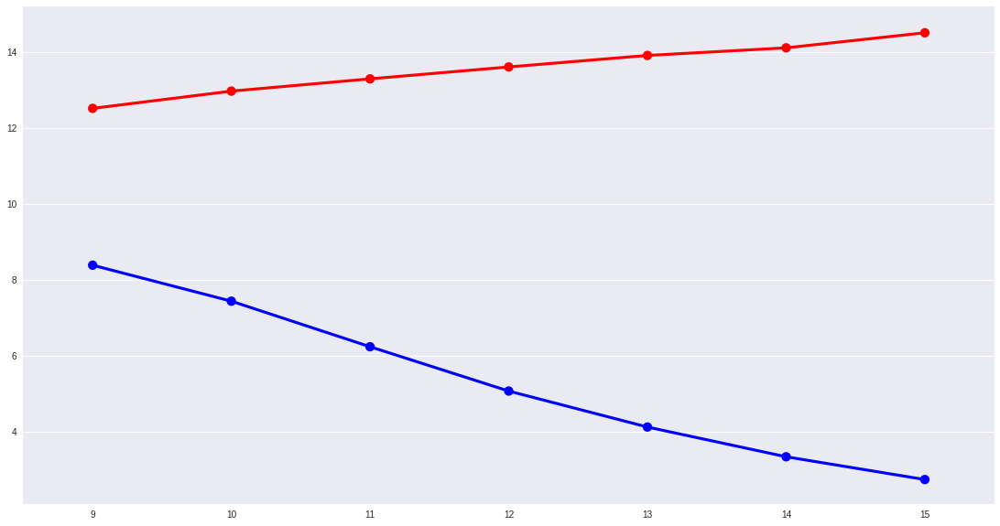

In [0]:
plt.figure(figsize = (19,10))
sns.pointplot(max_depth,list(train_error.values()),color = 'blue')
sns.pointplot(max_depth,list(test_error.values()),color = 'red')
plt.legend(('blue','red'),('Test_error','Train_error'))


** Plotting the difference of Train and Test Errors ** 

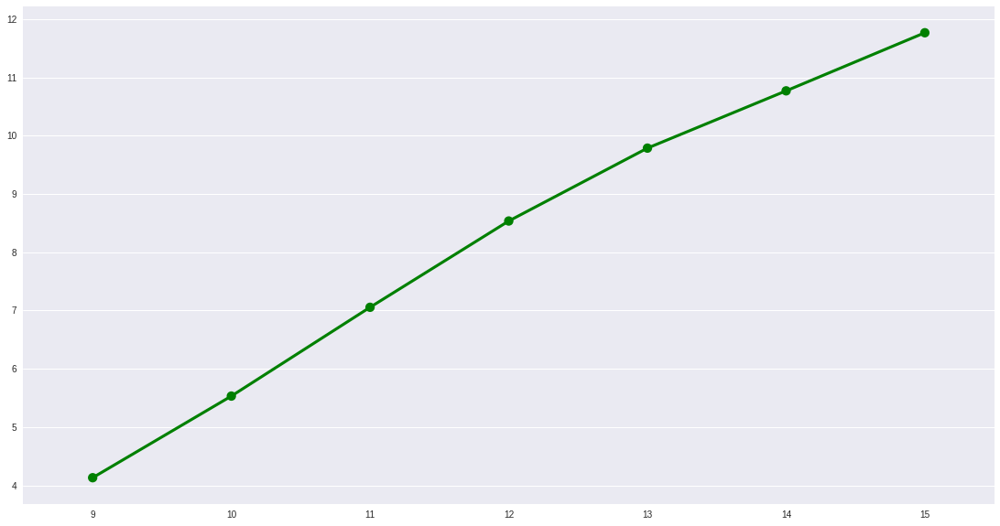

In [0]:
plt.figure(figsize = (19,10))
sns.pointplot(max_depth,difference,color = 'green')

** Observations : ** 

1. According to the Grid results ** Max_depth = 15 ** is giving the highest F1 score of the negative reviews class
2. In the case of over fitting, underfitting phenomenon of Trees. The tree with  ** max_depth = 9** is less likely to overfit and has more regularisation capability.
3. Maximum Depth : 9 will be the optimal value for training


** Model : Max_Depth = 9 **


In [0]:
model = DecisionTreeClassifier(criterion = "gini",min_samples_split = 5, max_depth = 9)
model.fit(X_train,y_train)
pred = model.predict(X_test)
t_pred = model.predict(X_train)

In [0]:
accuracy_score(t_pred,y_train)

0.9160857142857143

In [0]:
print(classification_report(pred,y_test))

             precision    recall  f1-score   support

          0       0.33      0.57      0.42      2362
          1       0.96      0.90      0.93     27638

avg / total       0.91      0.87      0.89     30000



** Test : Confusion Matrix ** 

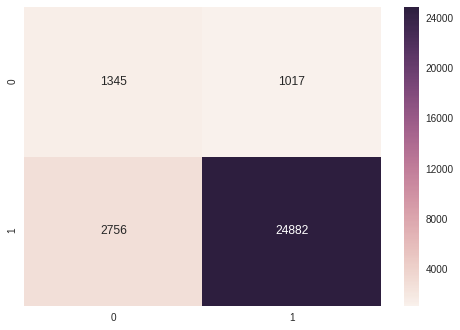

In [0]:
sns.heatmap(confusion_matrix(pred,y_test),annot= True,fmt='d')

** Train : Confusion Matrix ** 

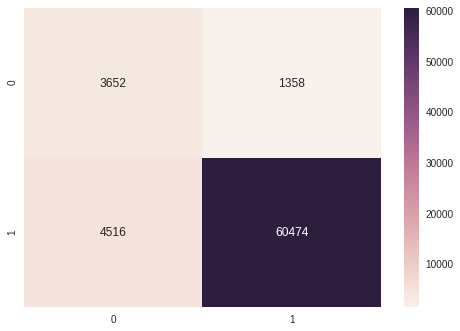

In [0]:
sns.heatmap(confusion_matrix(t_pred,y_train),annot=True,fmt='d')

| MAX-DEPTH | ACCURACY   |  RECALL : NEGATIVE REVIEWS |TRAIN ERROR | TEST ERROR | DIFFERENCE|
|------|------|-----|-----|----|----|
|9|87.42|57%|8.4%|12.58 |4.18|

 ** VISUALSING THE TREE **

In [0]:
def visualise_tree(clf):
  
  dot_data = tree.export_graphviz(clf,out_file=None,filled=True,rounded=True)
  graph = pydotplus.graph_from_dot_data(dot_data)
  colors = ('turquoise', 'orange')
  edges = collections.defaultdict(list)

  for edge in graph.get_edge_list():
    edges[edge.get_source()].append(int(edge.get_destination()))

  for edge in edges:
    edges[edge].sort()    
    for i in range(2):
        dest = graph.get_node(str(edges[edge][i]))[0]
        dest.set_fillcolor(colors[i])
  

  #plotting the Decision tree
  
  return graph.create_png()
  

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.491363 to fit



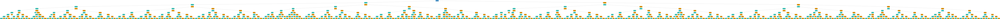

In [0]:
Image(visualise_tree(model))

____

<Br>

<br>

## FEATURIZATION : BOW 

** Importing the data **

In [0]:
bow_train = pickle.load(open('/content/gdrive/My Drive/AppliedAI/Amazon Fine Food Reviews/train_bow.sav','rb'))
bow_cv = pickle.load(open('/content/gdrive/My Drive/AppliedAI/Amazon Fine Food Reviews/cv_bow.sav','rb'))
bow_test = pickle.load(open('/content/gdrive/My Drive/AppliedAI/Amazon Fine Food Reviews/test_bow.sav','rb'))
y_train = pickle.load(open('/content/gdrive/My Drive/AppliedAI/Amazon Fine Food Reviews/y_train.sav','rb'))
y_test = pickle.load(open('/content/gdrive/My Drive/AppliedAI/Amazon Fine Food Reviews/y_test.sav','rb'))
y_cv = pickle.load(open('/content/gdrive/My Drive/AppliedAI/Amazon Fine Food Reviews/y_cv.sav','rb'))
bow = pickle.load(open('/content/gdrive/My Drive/AppliedAI/Amazon Fine Food Reviews/BOW.sav','rb'))

** CONCATENATING TRAIN AND CV  TO CREATE DATASET FOR CROSS VALIDATION** 

In [0]:
X_train = vstack([bow_train,bow_cv])
Y_train = pd.concat([y_train,y_cv],axis = 0,ignore_index = True)

** Defining the Paramter Grid :** 

Tuning with a different hyperparameter : Minium_sample_leafs 
1. Max Depth 
2. Minimum_samples_leaf

** Scoring : F1 Score of Negative Class**

In [0]:
max_depth = [3,5,7,9,11,13,15]
min_samples_leaf =[10,20,30,40,50,60]

param_grid = {'max_depth':max_depth,'min_samples_leaf':min_samples_leaf}

In [0]:
model = GridSearchCV(DecisionTreeClassifier(max_features = None,class_weight='balanced'),param_grid,n_jobs =-1,scoring= metrics.make_scorer(metrics.scorer.f1_score,average="binary",pos_label =0),verbose=True)
model.fit(X_train,Y_train)

Fitting 3 folds for each of 42 candidates, totalling 126 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   56.6s
[Parallel(n_jobs=-1)]: Done 126 out of 126 | elapsed:  4.9min finished


GridSearchCV(cv=None, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=None, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': [3, 5, 7, 9, 11, 13, 15], 'min_samples_leaf': [10, 20, 30, 40, 50, 60]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=make_scorer(f1_score, average=binary, pos_label=0),
       verbose=True)

In [0]:
model.best_params_

{'max_depth': 15, 'min_samples_leaf': 50}

In [0]:
results = pd.DataFrame(model.cv_results_['params'])

In [0]:
results['Test_Score'] = model.cv_results_['mean_test_score']
results['Train_Score'] = model.cv_results_['mean_train_score']

____
** Visualising the results ** 

** 1. Cross validated : Test Scores ** 

Variation of F1 Score vs Max_depth of tree. Hue = Mini_samples_leaf

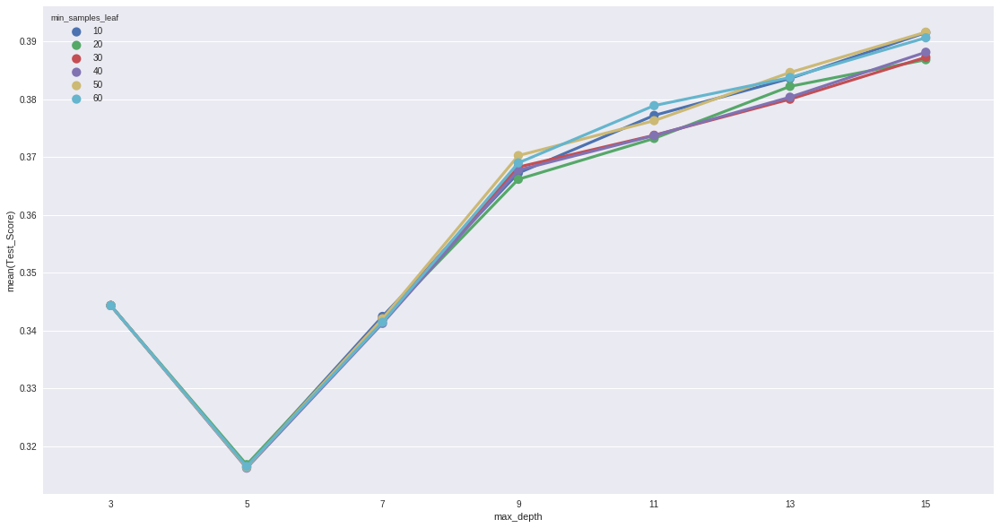

In [0]:
plt.figure(figsize=(19,10))
sns.pointplot(x = 'max_depth',y='Test_Score',data = results, hue = 'min_samples_leaf')

** 2. Cross validated : Train Scores ** 

Variation of F1 Score vs Max_depth of tree. Hue = Mini_samples_leaf

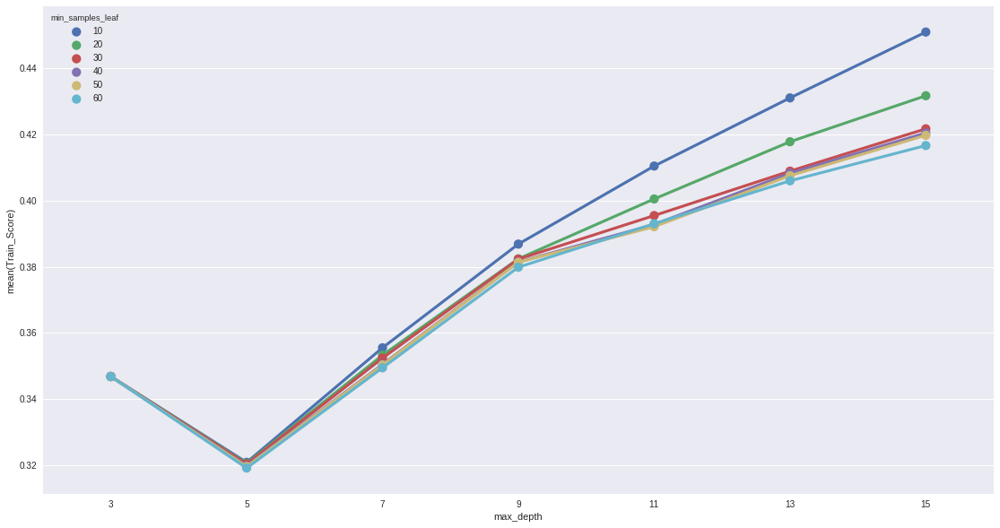

In [0]:
plt.figure(figsize=(19,10))
sns.pointplot(x = 'max_depth',y='Train_Score',data = results, hue = 'min_samples_leaf')

** Observations ** 

1. Keeping the Minimum samples that has to be reached to be a Leaf node has higher train score and comapritively less test score. It is causing the overfitting phenomenon
2. Overall the Decision Tree classifier is performing poor over the BOW representation.. the max depth can be narrowed down from the range of 9 to 15 
3. 15 giving the best score of F1 for negative class 

** Narrowing down the Search : Train and Test difference  ** 
1. Observe the phenomenon of overfiiting and underfitting 

In [0]:
max_depth = [9,10,11,12,13,14,15]
train_error = {}
test_error = {}
difference = []
f1 = {}
for i in max_depth:
  print("Training for Max Depth = :" + str(i) + "\n")
  model = DecisionTreeClassifier(criterion = "gini",min_samples_split = 5, max_depth = i)
  model.fit(X_train,Y_train)
  pred = model.predict(bow_test)
  f1[i] = f1_score(pred,y_test,pos_label = 0)
  t_pred = model.predict(X_train)
  test_error[i] = (1 - metrics.accuracy_score(pred,y_test)) * 100
  train_error[i] = (1 - metrics.accuracy_score(t_pred,Y_train)) * 100
  difference.append(test_error[i]- train_error[i]) 

Training for Max Depth = :9

Training for Max Depth = :10

Training for Max Depth = :11

Training for Max Depth = :12

Training for Max Depth = :13

Training for Max Depth = :14

Training for Max Depth = :15



** 1. Train and Test Error ** 

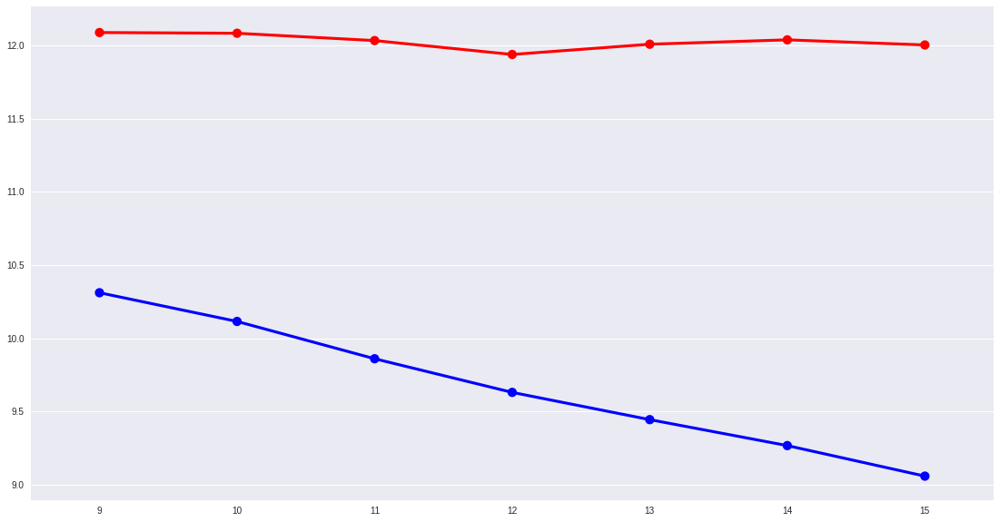

In [0]:
plt.figure(figsize = (19,10))
sns.pointplot(max_depth,list(train_error.values()),color = 'blue')
sns.pointplot(max_depth,list(test_error.values()),color = 'red')
plt.legend(('blue','red'),('Test_error','Train_error'))


**2. Train - Test Difference ** 

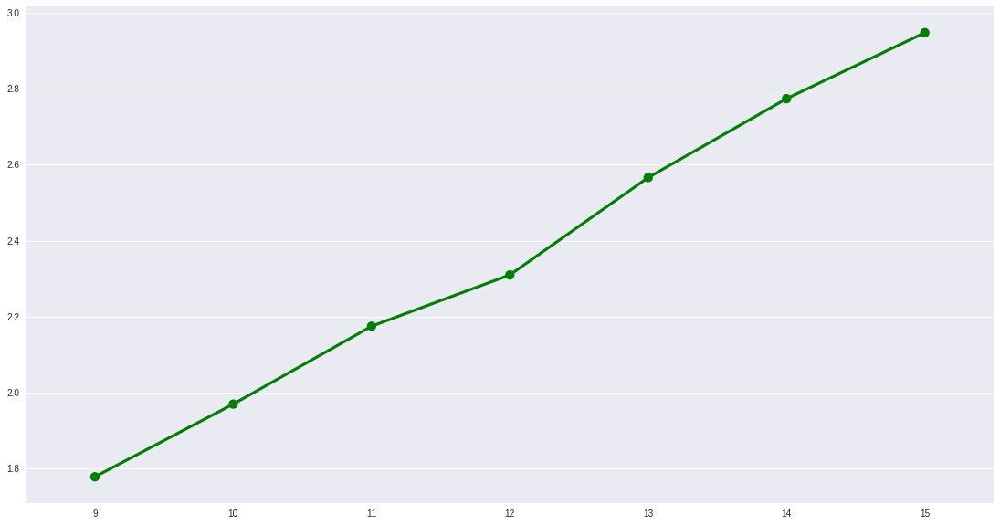

In [0]:
plt.figure(figsize = (19,10))
sns.pointplot(max_depth,difference,color = 'green')

** F1 Score : Negative Reviews : Test _ Data  **

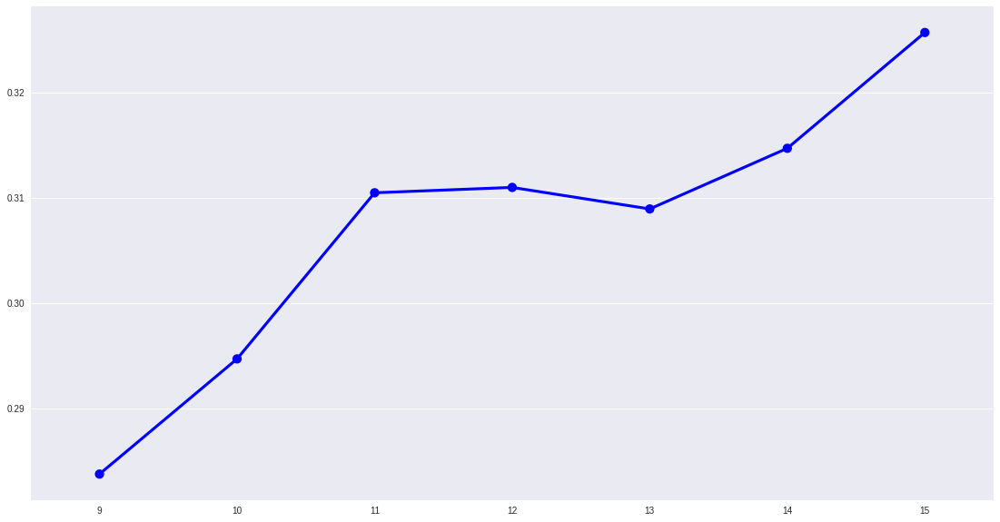

In [0]:
plt.figure(figsize = (19,10))
sns.pointplot(max_depth,list(f1.values()),color = 'blue')

** Observations : **

1. There is no significant variation in the difference of train and test errors. All are lying under the range 1.8 to 3.0 
2. Max_depth having the least f1 score on test data is 2.4% lower than the best estimate : Max_depth = 15.
**3. Final max_depth = 15  **

In [0]:
model = DecisionTreeClassifier(criterion = "gini", max_depth = 15)
model.fit(X_train,Y_train)
pred = model.predict(bow_test)
t_pred = model.predict(X_train)

In [0]:
accuracy_score(t_pred,Y_train)

0.90995

In [0]:
print(classification_report(pred,y_test))

             precision    recall  f1-score   support

          0       0.21      0.65      0.32       873
          1       0.98      0.89      0.93     19127

avg / total       0.95      0.88      0.91     20000



** Test : Confusion Matrix ** 

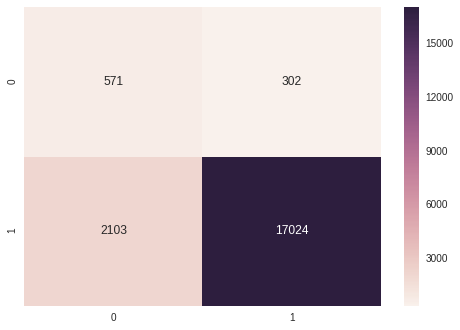

In [0]:
sns.heatmap(confusion_matrix(pred,y_test),annot= True,fmt='d')

** Train : Confusion Matrix ** 

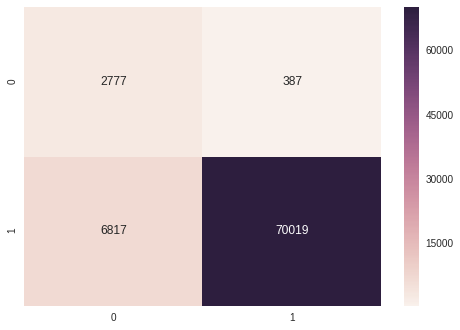

In [0]:
sns.heatmap(confusion_matrix(t_pred,Y_train),annot=True,fmt='d')

----
<br>
** Feature importance ** 

In [0]:
features = bow.get_feature_names()

In [0]:
f_imp = dict(zip(features,model.feature_importances_))

In [0]:
top_10 = {}
for i in sorted(f_imp.items(), key=operator.itemgetter(1),reverse= True)[:10]:
  top_10[i[0]] = i[1]

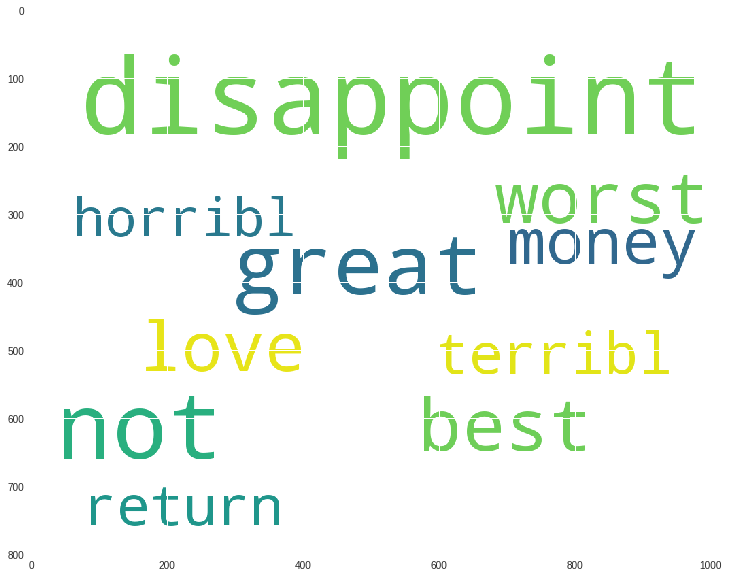

In [0]:
plt.figure( figsize=(20,10))
plt.imshow(wordcloud.WordCloud(background_color='white',width = 1000,height= 800).generate_from_frequencies(top_10))

____

<br>
** Visualising the Tree  : With Feature_names ** 

In [0]:
def visualise_tree(clf,f_names):
  
  dot_data = tree.export_graphviz(clf,out_file=None,filled=True,rounded=True,feature_names = f_names)
  graph = pydotplus.graph_from_dot_data(dot_data)
  colors = ('turquoise', 'orange')
  edges = collections.defaultdict(list)

  for edge in graph.get_edge_list():
    edges[edge.get_source()].append(int(edge.get_destination()))

  for edge in edges:
    edges[edge].sort()    
    for i in range(2):
        dest = graph.get_node(str(edges[edge][i]))[0]
        dest.set_fillcolor(colors[i])
  

  #plotting the Decision tree
  
  return graph.create_jpeg()
  

In [0]:
Image(visualise_tree(model, bow.get_feature_names()))

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879769 to fit



The root node : Disappoint and child nodes: Not and Won't being the best splits on the top

<Br>
  <Br>
    <br>
    
  ______

<Br>
  <br>
  
  ## FEATURIZATION : TFIDF 

** Importing the data **

In [0]:
tf_train = pickle.load(open('/content/gdrive/My Drive/AppliedAI/Amazon Fine Food Reviews/train_tfidf.sav','rb'))
tf_cv = pickle.load(open('/content/gdrive/My Drive/AppliedAI/Amazon Fine Food Reviews/cv_tfidf.sav','rb'))
tf_test = pickle.load(open('/content/gdrive/My Drive/AppliedAI/Amazon Fine Food Reviews/test_tfidf.sav','rb'))
y_train = pickle.load(open('/content/gdrive/My Drive/AppliedAI/Amazon Fine Food Reviews/y_train.sav','rb'))
y_test = pickle.load(open('/content/gdrive/My Drive/AppliedAI/Amazon Fine Food Reviews/y_test.sav','rb'))
y_cv = pickle.load(open('/content/gdrive/My Drive/AppliedAI/Amazon Fine Food Reviews/y_cv.sav','rb'))
tfidf = pickle.load(open('/content/gdrive/My Drive/AppliedAI/Amazon Fine Food Reviews/tfidf.sav','rb'))

** CONCATENATING TRAIN AND CV  TO CREATE DATASET FOR CROSS VALIDATION** 

In [0]:
X_train = vstack([tf_train,tf_cv])
Y_train = pd.concat([y_train,y_cv],axis = 0,ignore_index = True)

In [10]:
X_train

<80000x29133 sparse matrix of type '<class 'numpy.float64'>'
	with 2424650 stored elements in Compressed Sparse Row format>

** Defining the Paramter Grid :** 

1. Max Depth 
2. Minimum_samples_leaf

** Scoring : F1 Score of Negative Class**

In [0]:
max_depth = [3,5,7,9,11,13,15]
min_samples_leaf =[10,20,30,40,50,60]

param_grid = {'max_depth':max_depth,'min_samples_leaf':min_samples_leaf}

In [0]:
model = GridSearchCV(DecisionTreeClassifier(max_features = None,class_weight='balanced'),param_grid,n_jobs =-1,scoring= metrics.make_scorer(metrics.scorer.f1_score,average="binary",pos_label =0),verbose=True)
model.fit(X_train,Y_train)

Fitting 3 folds for each of 42 candidates, totalling 126 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 126 out of 126 | elapsed:  6.8min finished


GridSearchCV(cv=None, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=None, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': [3, 5, 7, 9, 11, 13, 15], 'min_samples_leaf': [10, 20, 30, 40, 50, 60]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=make_scorer(f1_score, average=binary, pos_label=0),
       verbose=True)

In [0]:
model.best_params_

{'max_depth': 15, 'min_samples_leaf': 10}

In [0]:
model.best_score_

0.3743744370951087

In [0]:
results = pd.DataFrame(model.cv_results_['params'])

In [0]:
results['Test_Score'] = model.cv_results_['mean_test_score']
results['Train_Score'] = model.cv_results_['mean_train_score']

_____
** VISUALISING THE RESULTS **

** 1. Cross validated : Test Scores ** 

Variation of F1 Score vs Max_depth of tree. Hue = Mini_samples_leaf

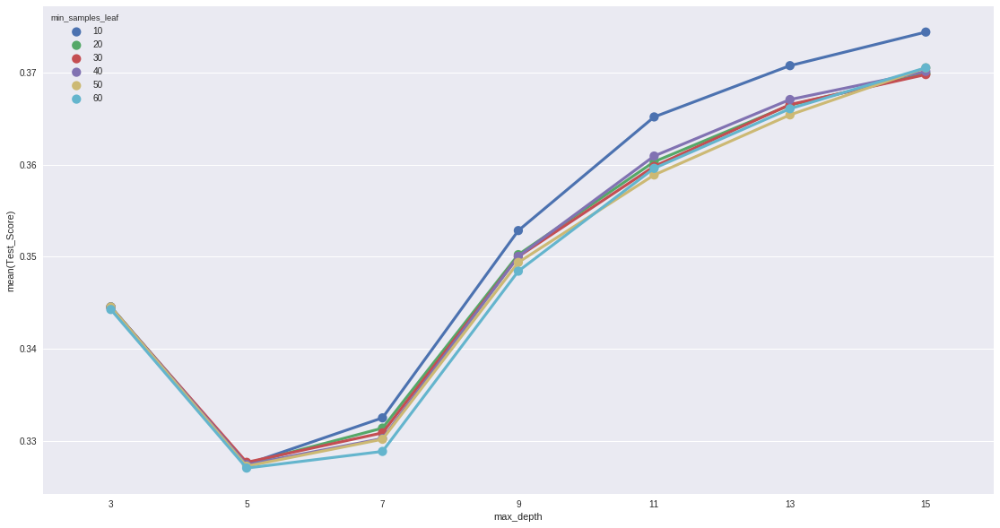

In [0]:
plt.figure(figsize=(19,10))
sns.pointplot(x = 'max_depth',y='Test_Score',data = results, hue = 'min_samples_leaf')

** 2. Cross validated : Train Scores ** 

Variation of F1 Score vs Max_depth of tree. Hue = Mini_samples_leaf

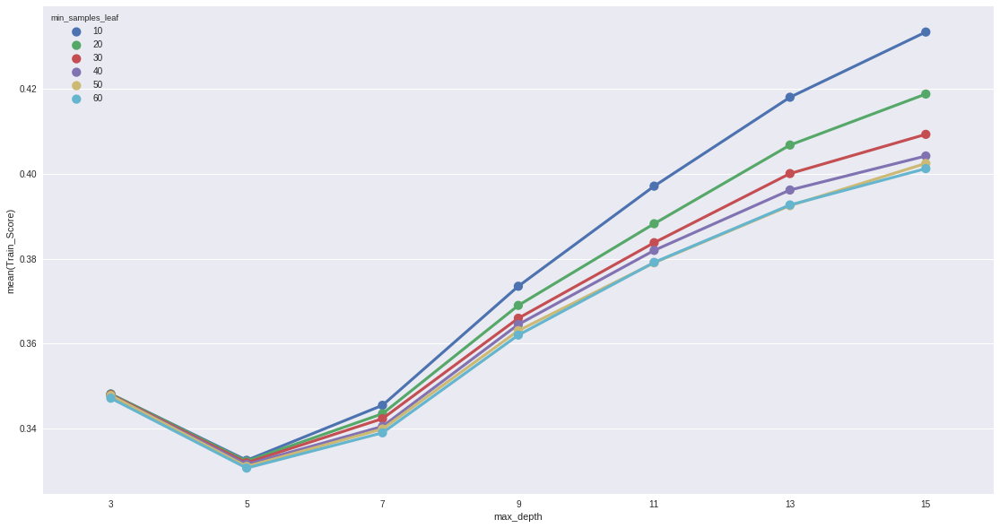

In [0]:
plt.figure(figsize=(19,10))
sns.pointplot(x = 'max_depth',y='Train_Score',data = results, hue = 'min_samples_leaf')

** Observations : **

1. Minium Sample Leaves : 10 is performing better in both train and test values
2. In order to finalise the maximum depth the search has to be narrowed down frm 9 -15 


** Narrowing down the Search : Train and Test difference  ** 
1. Observe the phenomenon of overfiiting and underfitting 

In [11]:
max_depth = [9,10,11,12,13,14,15]
train_error = {}
test_error = {}
difference = []
f1 = {}
for i in max_depth:
  print("Training for Max Depth = :" + str(i) + "\n")
  model = DecisionTreeClassifier(criterion = "gini",min_samples_leaf = 10, max_depth = i)
  model.fit(X_train,Y_train)
  pred = model.predict(tf_test)
  f1[i] = f1_score(pred,y_test,pos_label = 0)
  t_pred = model.predict(X_train)
  test_error[i] = (1 - metrics.accuracy_score(pred,y_test)) * 100
  train_error[i] = (1 - metrics.accuracy_score(t_pred,Y_train)) * 100
  difference.append(test_error[i]- train_error[i]) 

Training for Max Depth = :9

Training for Max Depth = :10

Training for Max Depth = :11

Training for Max Depth = :12

Training for Max Depth = :13

Training for Max Depth = :14

Training for Max Depth = :15



** 1. Train and Test Error ** 

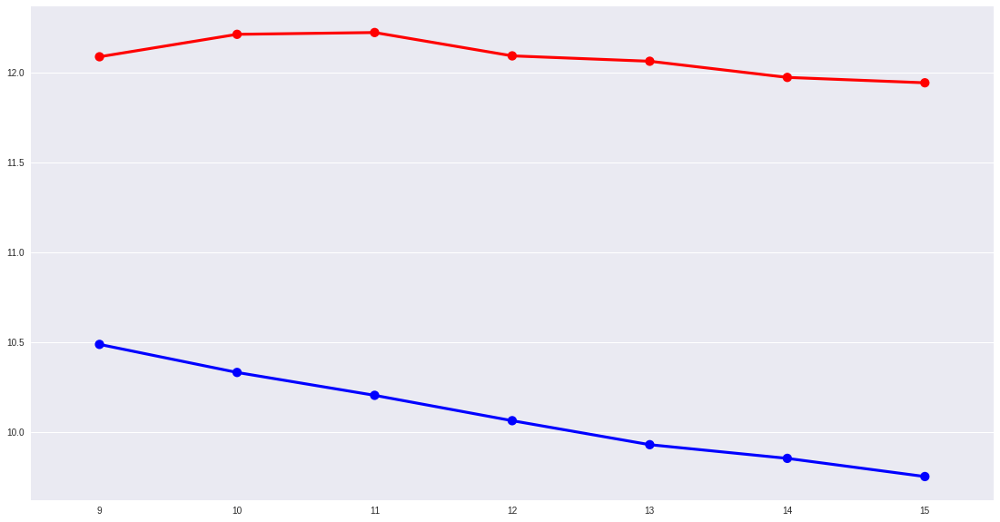

In [12]:
plt.figure(figsize = (19,10))
sns.pointplot(max_depth,list(train_error.values()),color = 'blue')
sns.pointplot(max_depth,list(test_error.values()),color = 'red')
plt.legend(('blue','red'),('Test_error','Train_error'))


**2. Train - Test Difference ** 

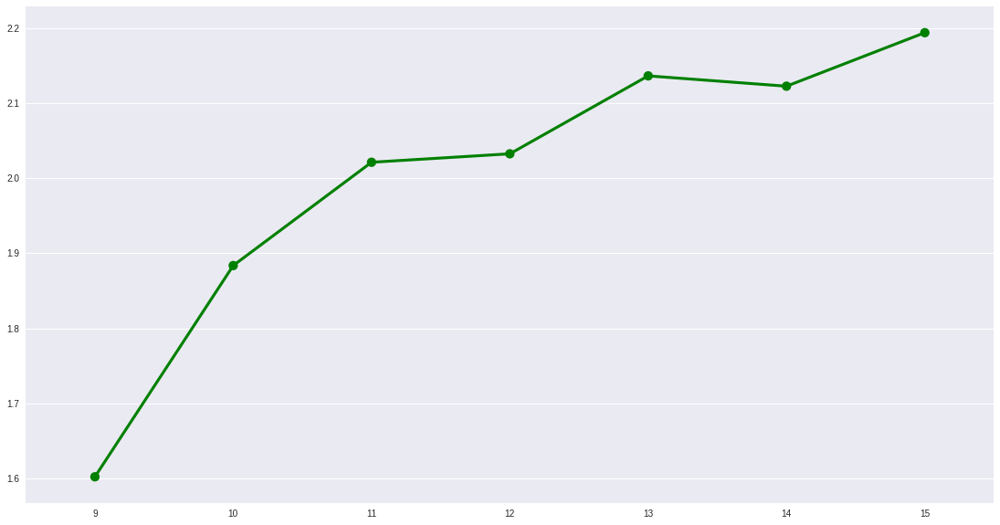

In [13]:
plt.figure(figsize = (19,10))
sns.pointplot(max_depth,difference,color = 'green')

** F1 : SCORE  : NEGATIVE REVIEWS TEST DATA  ** 

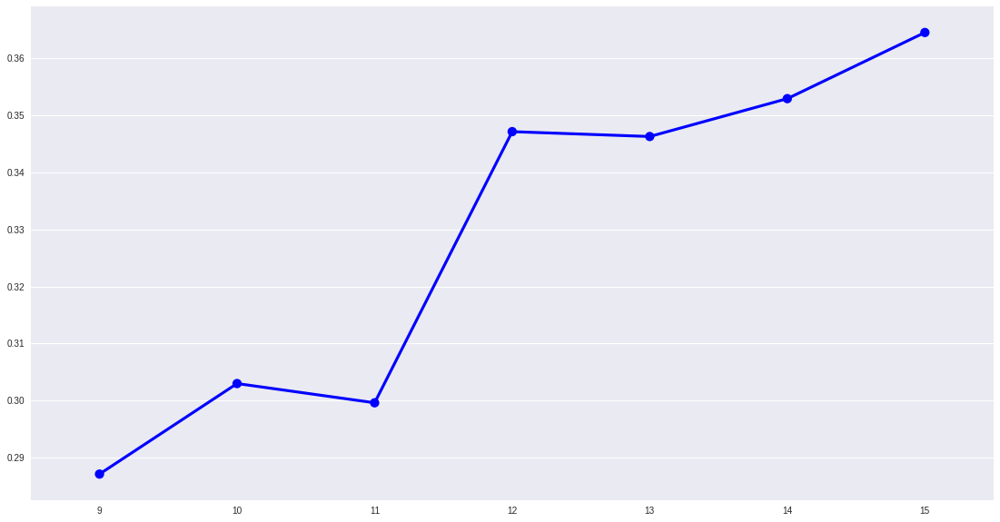

In [14]:
plt.figure(figsize = (19,10))
sns.pointplot(max_depth,list(f1.values()),color = 'blue')

** Observations : **
1. There is just 1 % difference between the F1 score of tree with depth 12 in comparison with depth 15 
2. Choosing the Final depth = 12 keeping in mind of the overfitting and underfitting phenomenon
3. The differences between the train and test errors are very less even though the overall maginitude is large (ranging from 10% to 13%)

** Final Model  : TF IDF : 12 ** 

In [0]:
model = DecisionTreeClassifier(criterion = "gini", max_depth = 12)
model.fit(X_train,Y_train)
pred = model.predict(tf_test)
t_pred = model.predict(X_train)

In [25]:
accuracy_score(t_pred,Y_train)

0.9050625

In [26]:
print(classification_report(pred,y_test))

              precision    recall  f1-score   support

           0       0.24      0.64      0.35      1012
           1       0.98      0.89      0.93     18988

   micro avg       0.88      0.88      0.88     20000
   macro avg       0.61      0.77      0.64     20000
weighted avg       0.94      0.88      0.90     20000



** Test : Confusion Matrix ** 

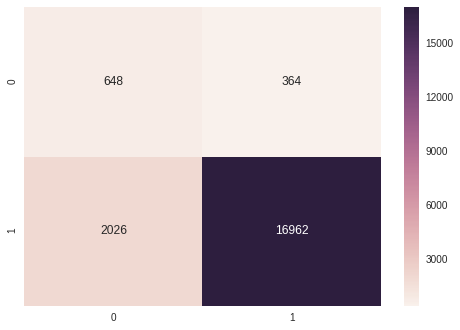

In [27]:
sns.heatmap(confusion_matrix(pred,y_test),annot= True,fmt='d')

** Train : Confusion Matrix ** 

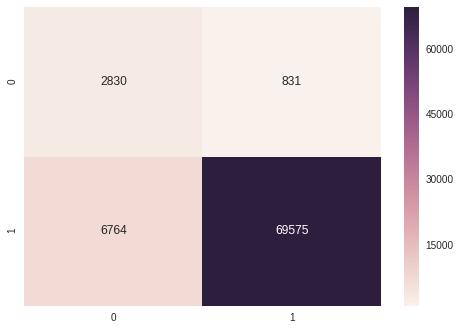

In [28]:
sns.heatmap(confusion_matrix(t_pred,Y_train),annot=True,fmt='d')

----
<br>
** Feature importance ** 

In [0]:
features = tfidf.get_feature_names()

In [0]:
f_imp = dict(zip(features,model.feature_importances_))

In [0]:
top_10 = {}
for i in sorted(f_imp.items(), key=operator.itemgetter(1),reverse= True)[:10]:
  top_10[i[0]] = i[1]

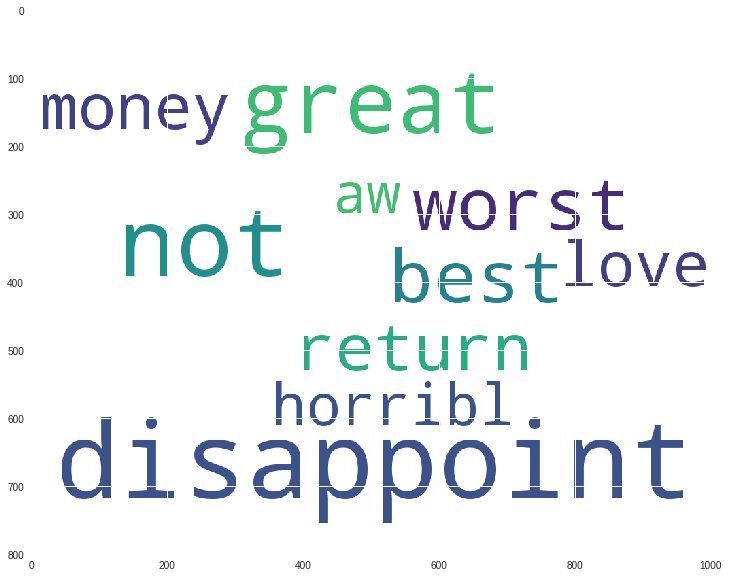

In [32]:
plt.figure( figsize=(20,10))
plt.imshow(wordcloud.WordCloud(background_color='white',width = 1000,height= 800).generate_from_frequencies(top_10))

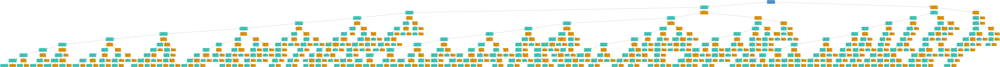

In [35]:
Image(visualise_tree(model, tfidf.get_feature_names()))

<Br>
  <Br>
    <br>
    
  ______

<Br>
  <br>
  
  ## FEATURIZATION : TFIDF WORD2VEC

** Importing the data **

In [0]:
tfw2v_train = pickle.load(open('/content/gdrive/My Drive/AppliedAI/Amazon Fine Food Reviews/Train_TFW2V.sav','rb'))
tfw2v_test = pickle.load(open('/content/gdrive/My Drive/AppliedAI/Amazon Fine Food Reviews/Test_TFW2V.sav','rb'))

In [0]:
X_train = tfw2v_train.iloc[:,0:50].copy(deep=True)
X_test = tfw2v_test.iloc[:,0:50].copy(deep=True)
y_train = tfw2v_train['Score']

y_test = tfw2v_test['Score']

** Defining the Paramter Grid :** 

1. Max Depth 
2. Minimum_samples_leaf

** Scoring : F1 Score of Negative Class**

In [0]:
max_depth = [3,5,7,9,11,13,15]
min_samples_leaf =[10,20,30,40,50,60]

param_grid = {'max_depth':max_depth,'min_samples_leaf':min_samples_leaf}

In [0]:
model = GridSearchCV(DecisionTreeClassifier(max_features = None,class_weight='balanced'),param_grid,n_jobs =-1,scoring= metrics.make_scorer(metrics.scorer.f1_score,average="binary",pos_label =0),verbose=True)
model.fit(X_train,y_train)

Fitting 3 folds for each of 42 candidates, totalling 126 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 126 out of 126 | elapsed:  4.1min finished


GridSearchCV(cv=None, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=None, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': [3, 5, 7, 9, 11, 13, 15], 'min_samples_leaf': [10, 20, 30, 40, 50, 60]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=make_scorer(f1_score, average=binary, pos_label=0),
       verbose=True)

In [0]:
model.best_params_

{'max_depth': 13, 'min_samples_leaf': 20}

In [0]:
model.best_score_

0.35810076351716147

In [0]:
results = pd.DataFrame(model.cv_results_['params'])

In [0]:
results['Test_Score'] = model.cv_results_['mean_test_score']
results['Train_Score'] = model.cv_results_['mean_train_score']

_____
** VISUALISING THE RESULTS **

** 1. Cross validated : Test Scores ** 

Variation of F1 Score vs Max_depth of tree. Hue = Mini_samples_leaf

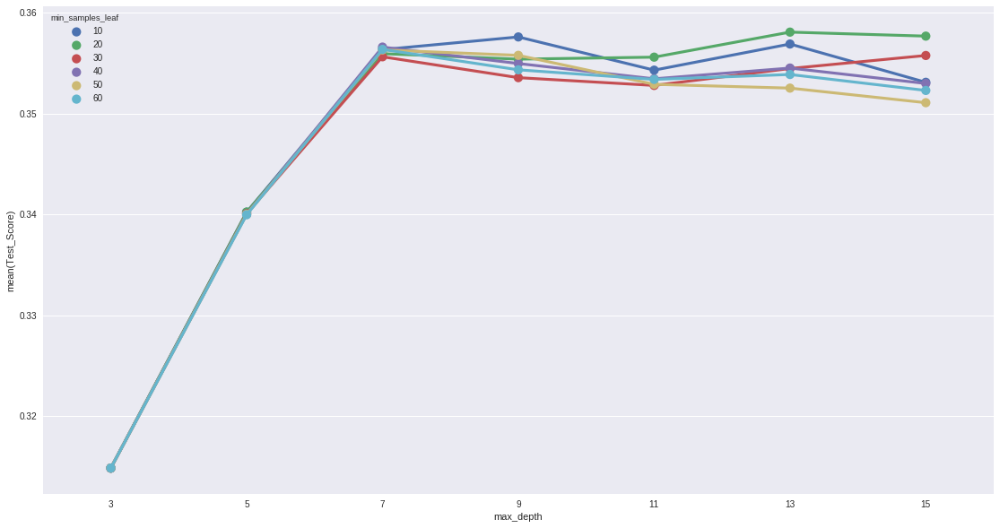

In [0]:
plt.figure(figsize=(19,10))
sns.pointplot(x = 'max_depth',y='Test_Score',data = results, hue = 'min_samples_leaf')

** 2. Cross validated : Train Scores ** 

Variation of F1 Score vs Max_depth of tree. Hue = Mini_samples_leaf

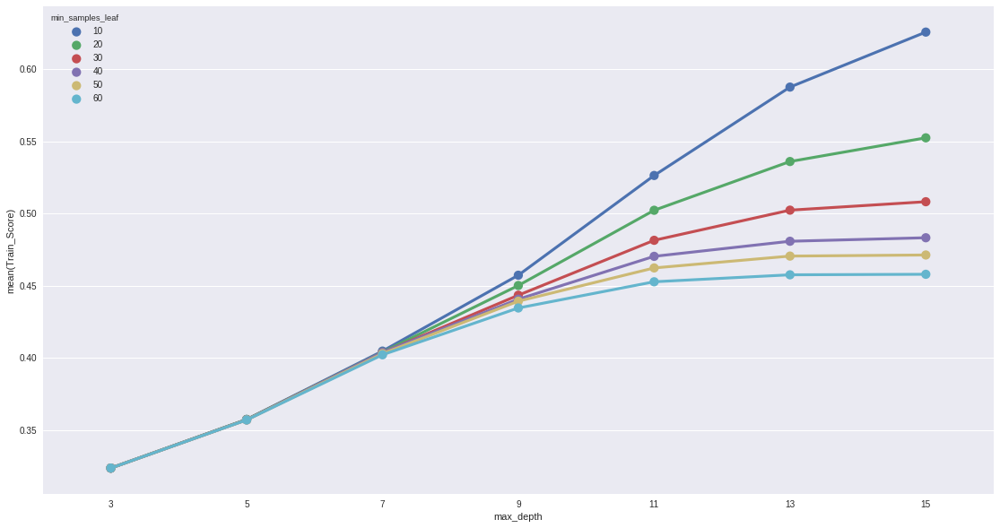

In [0]:
plt.figure(figsize=(19,10))
sns.pointplot(x = 'max_depth',y='Train_Score',data = results, hue = 'min_samples_leaf')

** Observations  : **

1. In test scores : The F1 score are almost saturating between 35 - 36 % between max_depth = 7 - 15
2. In train scores: The F1 score is almost 10% higher where the minimum_sample_leaf = 10. Signifying that the tree is splitting to very deeper level. 
3. Keep the overfitting phenomenon in mind we can select minimum_sample_leaf = 20 which has  approximately 5% larger f1 score than the other hyperparameters 

** Narrowing down the Search : Train and Test difference  ** 
1. Observe the phenomenon of overfiiting and underfitting 

In [39]:
max_depth = [7,8,9,10,11,12,13,14,15]
train_error = {}
test_error = {}
difference = []
f1 = {}
for i in max_depth:
  print("Training for Max Depth = :" + str(i) + "\n")
  model = DecisionTreeClassifier(criterion = "gini", max_depth = i,min_samples_leaf=20)
  model.fit(X_train,y_train)
  pred = model.predict(X_test)
  f1[i] = f1_score(pred,y_test,pos_label = 0)
  t_pred = model.predict(X_train)
  test_error[i] = (1 - metrics.accuracy_score(pred,y_test)) * 100
  train_error[i] = (1 - metrics.accuracy_score(t_pred,y_train)) * 100
  difference.append(test_error[i]- train_error[i]) 

Training for Max Depth = :7

Training for Max Depth = :8

Training for Max Depth = :9

Training for Max Depth = :10

Training for Max Depth = :11

Training for Max Depth = :12

Training for Max Depth = :13

Training for Max Depth = :14

Training for Max Depth = :15



** 1. Train and Test Error ** 

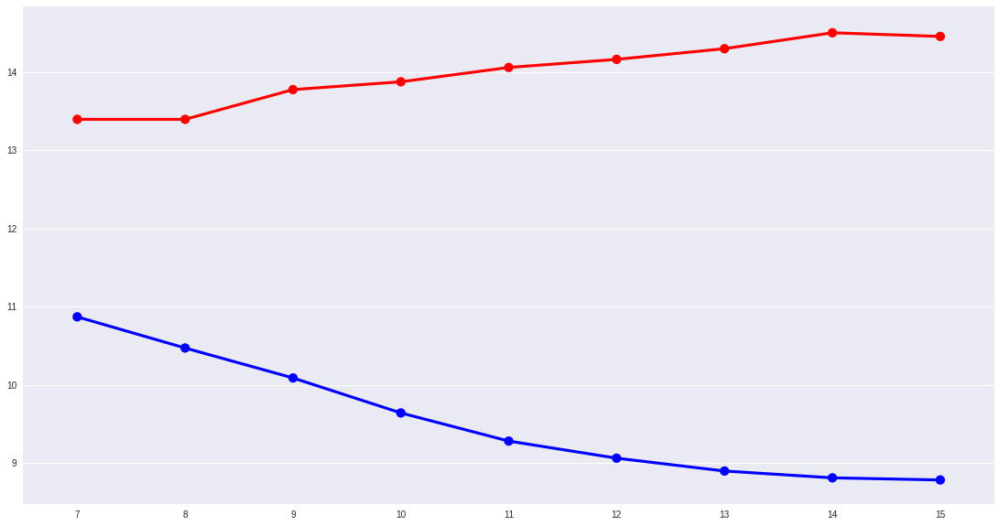

In [40]:
plt.figure(figsize = (19,10))
sns.pointplot(max_depth,list(train_error.values()),color = 'blue')
sns.pointplot(max_depth,list(test_error.values()),color = 'red')
plt.legend(('blue','red'),('Test_error','Train_error'))


**2. Train - Test Difference ** 

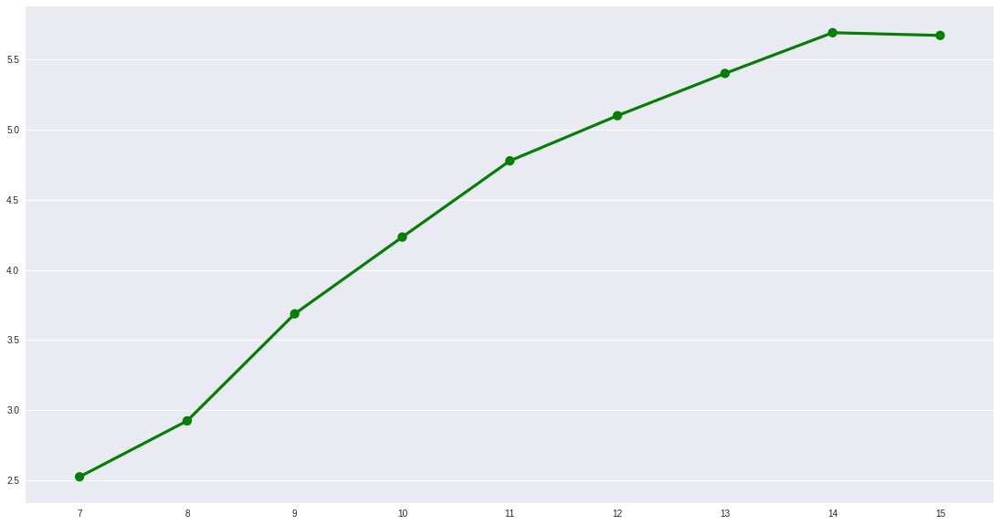

In [41]:
plt.figure(figsize = (19,10))
sns.pointplot(max_depth,difference,color = 'green')

** F1 : SCORE  : NEGATIVE REVIEWS TEST DATA  ** 

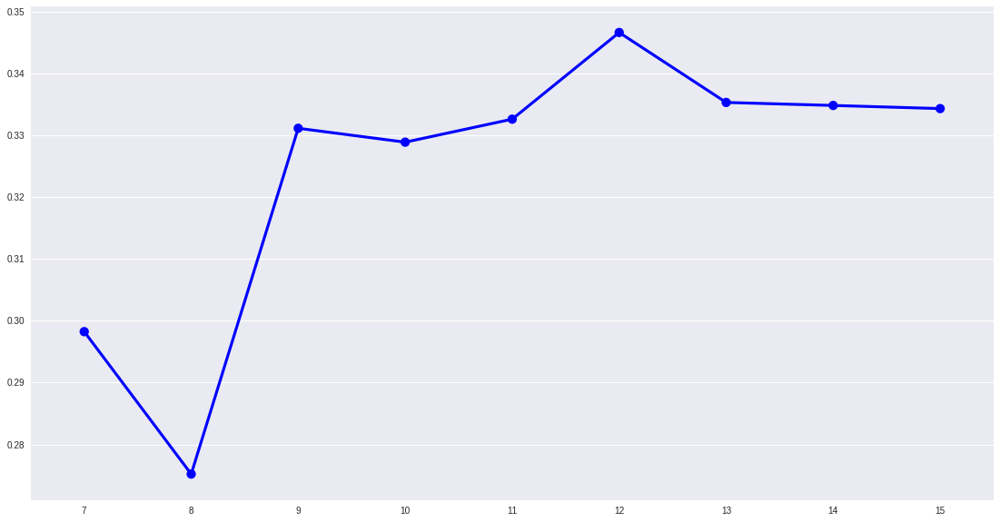

In [42]:
plt.figure(figsize = (19,10))
sns.pointplot(max_depth,list(f1.values()),color = 'blue')

** Observations ** 

1. Clearly max_depth = 12 gives the best F1 score for the negative reviews 

** Final Model  : TF IDF WORD2VEC : Max_ Depth = 12  ** 

In [0]:
model = DecisionTreeClassifier(criterion = "gini", max_depth = 12)
model.fit(X_train,y_train)
pred = model.predict(X_test)
t_pred = model.predict(X_train)

In [44]:
accuracy_score(t_pred,y_train)

0.9385

In [45]:
print(classification_report(pred,y_test))

              precision    recall  f1-score   support

           0       0.29      0.42      0.35      2836
           1       0.94      0.89      0.91     27164

   micro avg       0.85      0.85      0.85     30000
   macro avg       0.62      0.66      0.63     30000
weighted avg       0.88      0.85      0.86     30000



** Test : Confusion Matrix ** 

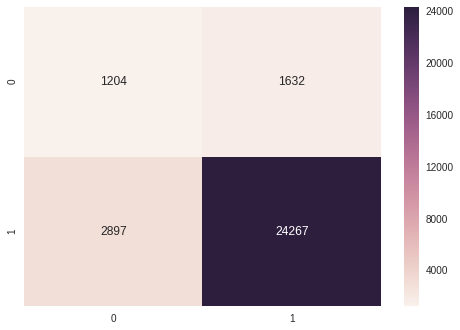

In [46]:
sns.heatmap(confusion_matrix(pred,y_test),annot= True,fmt='d')

** Train : Confusion Matrix ** 

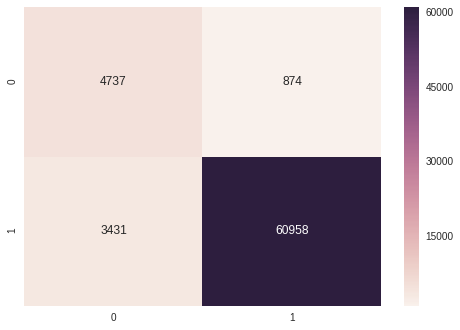

In [47]:
sns.heatmap(confusion_matrix(t_pred,y_train),annot=True,fmt='d')

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.207045 to fit



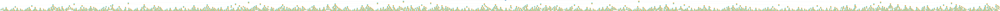

In [51]:
Image(visualise_tree(model))

<br>
<br>
<br>
______






### SUMMARY

|FEATURIZATION| MAX-DEPTH | ACCURACY   |  RECALL : NEGATIVE REVIEWS |TRAIN ERROR | TEST ERROR | DIFFERENCE|
|------|------|-----|-----|----|----|
|WORD2VEC|9|87.42|57%|8.4%|12.58 |4.18|
|BOW|15|90.995|65%|8.95%|12.0%|2.95|
|TF-IDF|12|90.5|64%|10.10%|12.12%|2.02|
|TF-IDF WORD2VEC|12|93.85|42%|9.0|14.05%|5.05|